# Robustness Analysis: Multiplicative vs Additive Errors

This notebook compares the effectiveness of the toggling-frame robustness objective for both multiplicative and additive errors. It's strucuted as follows:
* Imports
* Problem Setups: Here we compare the effect of the toggling frame robustness objective on additive and multiplicative errors without any variational states.
    * Base case: unitary smooth pulse problem w/o any robustness or sentivity objectives
    * Adjoint: Optimize pulses for insenstivity to a) additive error, b) multiplcative error and c) both
    * Toggle Robustness: Optimize pulses for toggle-frame robustness to a - c above
    * Adjoint * Toggle: Both for a - c
* Plot Fidelity vs. Error
* Plot Trajectories and Control pulses
* Pareto Frontiers of Fidelity vs. Robustness Penality

## Imports

In [3]:
import Pkg; Pkg.activate(@__DIR__); Pkg.instantiate();
Pkg.develop(path="../../QuantumCollocation.jl")
using PiccoloQuantumObjects
using QuantumCollocation
using ForwardDiff
using LinearAlgebra
# using Plots
using SparseArrays
using Statistics
using CairoMakie
using NamedTrajectories
using TrajectoryIndexingUtils
using Random

  Activating project at `~/Documents/research/pulses/project/notebooks/src`
   Resolving package versions...
  No Changes to `~/Documents/research/pulses/project/notebooks/src/Project.toml`
  No Changes to `~/Documents/research/pulses/project/notebooks/src/Manifest.toml`


## Problem Setups
Here, we first setup the quantum systems and solve for optimal pulses. There are ten problems to solve in total (the default smooth unitary pulse case, and for adjoint only, robustness only, adjoint + robustness, there are 3 cases (additive error, mujltiplcative error, both) giving nine problems).

#### Preliminary Variables

In [4]:
# Problem parameters
T = 50
Δt = 0.2
U_goal = GATES.X
H_drive = PAULIS.X
Hₑ = PAULIS.X
rob_scale = 1 / 8.0
a_bound = 0.2
dda_bound = 0.1
piccolo_opts = PiccoloOptions(verbose=false)
da_bound=Inf



Inf

#### Quanutm System Setup 

In [5]:
# Default Template
# H = aX
sys = QuantumSystem([H_drive])

# additive error template
# H = aX
# H_var = X
∂ₑHₐ = PAULIS.X

varsys_add = VariationalQuantumSystem(
    [H_drive],
    [∂ₑHₐ]
)

# Multiplicative error template
# H = aX
# H_drive_m = a -> a[1] * H_drive
# H_vars_array = Function[H_drive_m]

# varsys_mult = VariationalQuantumSystem(
#     H_drive_m,
#     H_vars_array,
#     1
# )

varsys_mult = VariationalQuantumSystem(
    a -> a[1] * PAULIS.X,
    Function[a -> a[1] * PAULIS.X],
    1
)

# Combine both errors template
# H = aX
# H_var = [aX + X, 0]

# H_drive_b = a -> a[1] * H_drive
# H_vars_array = Function[a -> a[1] * H_drive + PAULIS.X]

# varsys_both = VariationalQuantumSystem(
#     H_drive_b,
#     H_vars_array,
#     1
# )

varsys_both = VariationalQuantumSystem(
    a -> a[1] * PAULIS.X,
    Function[a -> a[1] * PAULIS.X, a -> PAULIS.X],
    1
)

VariationalQuantumSystem: levels = 2, n_drives = 1

In [6]:
println(varsys_add.n_drives)
println(varsys_mult.n_drives)
println(varsys_both.n_drives)


1
1
1


Sanity check

In [7]:
default = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; a_bound = a_bound, dda_bound = dda_bound)
solve!(default, max_iter=150, print_level=5)


    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	control derivative names: [:da, :dda]
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.17, runnin

In [24]:
varsys_test = VariationalQuantumSystem(
    [PAULIS.X, PAULIS.Y],
    [PAULIS.X]
)

 add_prob = UnitaryVariationalProblem(
    varsys_test, GATES.X, T, Δt;
    variational_scales=[1.0], 
    sensitive_times=[[T]],
    Q_r = 1e2,
    piccolo_options=piccolo_opts
)
QuantumObjectives.unitary_fidelity_loss(add_prob.trajectory.Ũ⃗ᵥ1[:, end])

4110.683623564298

In [25]:
solve!(add_prob, max_iter=200, print_level=5)

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:    16270
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     2803

Total number of variables............................:     1130
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      246
                     variables with only upper bounds:        0
Total number of equality co

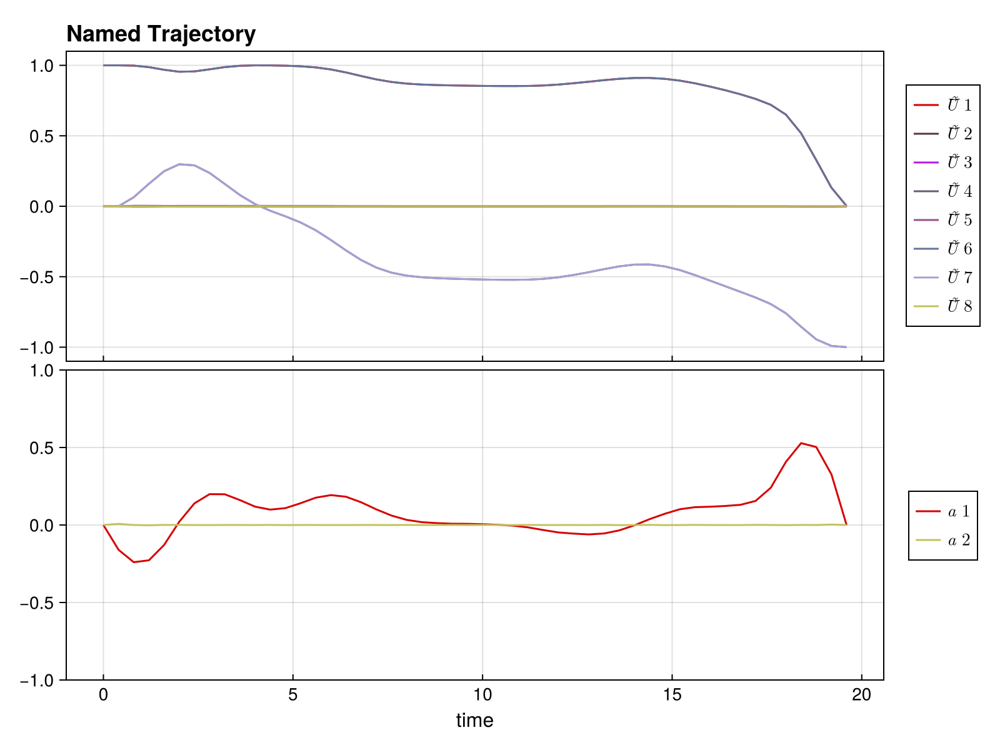

In [26]:
CairoMakie.plot(add_prob.trajectory, [:Ũ⃗, :a])

In [27]:
Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(add_prob.trajectory, varsys_mult);
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println
QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[1][:, end ÷ 2]) |> println
# QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[2][:, end ÷ 2]) |> println
QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[1][:, end]) |> println
# QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[2][:, end]) |> println

0.9999972214078564
0.08742200770647839
6.062266932812314


In [14]:
mult_prob = UnitaryVariationalProblem(
        varsys_mult, U_goal, T, Δt;
        sensitive_times=[[T]],
        a_bound = a_bound,
        dda_bound = dda_bound,
        piccolo_options=piccolo_opts
    )
solve!(mult_prob, max_iter=150, print_level=5)

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:    15112
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1733

Total number of variables............................:      982
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      148
                     variables with only upper bounds:        0
Total number of equality co

In [16]:
both_prob = UnitaryVariationalProblem(
        varsys_both, U_goal, T, Δt;
        sensitive_times=[[T]],
        a_bound = a_bound,
        dda_bound = dda_bound,
        piccolo_options=piccolo_opts
    )
solve!(both_prob, max_iter=150, print_level=5)

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: initial value of Ũ⃗ᵥ2
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:    31640
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1733

Total number of variables............................:     1374
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      148
                     variables with only

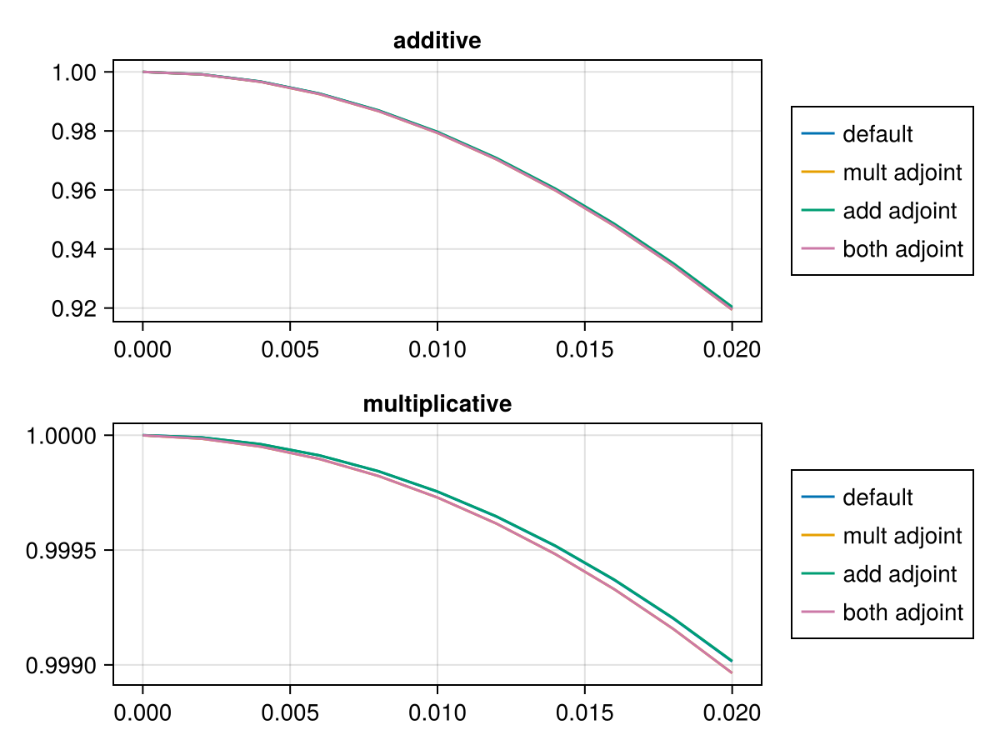

In [44]:
H_drive_add = H_drive

f = Figure()
ax1 = Axis(f[1, 1], title="additive")
ax2 = Axis(f[2, 1], title="multiplicative")

colors = Makie.wong_colors()

εs = 0:0.002:.02

# default case (smooth, non-variational, w/o toggling obj)

ys = [unitary_rollout_fidelity(default.trajectory, QuantumSystem(ε * PAULIS.X, [PAULIS.X])) for ε in εs]
lines!(ax1, εs, ys, label="default", color=colors[1], linestyle=:solid)

ys = [unitary_rollout_fidelity(default.trajectory, QuantumSystem([(1 + ε) * PAULIS.X])) for ε in εs]
lines!(ax2, εs, ys, label="default", color=colors[1], linestyle=:solid)

# adjoint-only (no toggling obj)

# (mult)
ys = [unitary_rollout_fidelity(mult_prob.trajectory, QuantumSystem(ε * PAULIS.X, [PAULIS.X])) for ε in εs]
lines!(ax1, εs, ys, label="mult adjoint", color=colors[2], linestyle=:solid)

ys = [unitary_rollout_fidelity(mult_prob.trajectory, QuantumSystem([(1 + ε) * PAULIS.X])) for ε in εs]
lines!(ax2, εs, ys, label="mult adjoint", color=colors[2], linestyle=:solid)

# (add)
ys = [unitary_rollout_fidelity(add_prob.trajectory, QuantumSystem(ε * PAULIS.X, [PAULIS.X])) for ε in εs]
lines!(ax1, εs, ys, label="add adjoint", color=colors[3], linestyle=:solid)

ys = [unitary_rollout_fidelity(add_prob.trajectory, QuantumSystem([(1 + ε) * PAULIS.X])) for ε in εs]
lines!(ax2, εs, ys, label="add adjoint", color=colors[3], linestyle=:solid)

# (both)
ys = [unitary_rollout_fidelity(both_prob.trajectory, QuantumSystem(ε * PAULIS.X, [PAULIS.X])) for ε in εs]
lines!(ax1, εs, ys, label="both adjoint", color=colors[4], linestyle=:solid)

ys = [unitary_rollout_fidelity(both_prob.trajectory, QuantumSystem([(1 + ε) * PAULIS.X])) for ε in εs]
lines!(ax2, εs, ys, label="both adjoint", color=colors[4], linestyle=:solid)



Legend(f[1,2], ax1, position=:lb)
Legend(f[2,2], ax2, position=:lb)

f


    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	control derivative names: [:da, :dda]
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:     4728
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1669

Total number of variables............................:      590
                     variables with only lower bounds:        0
                variables with 

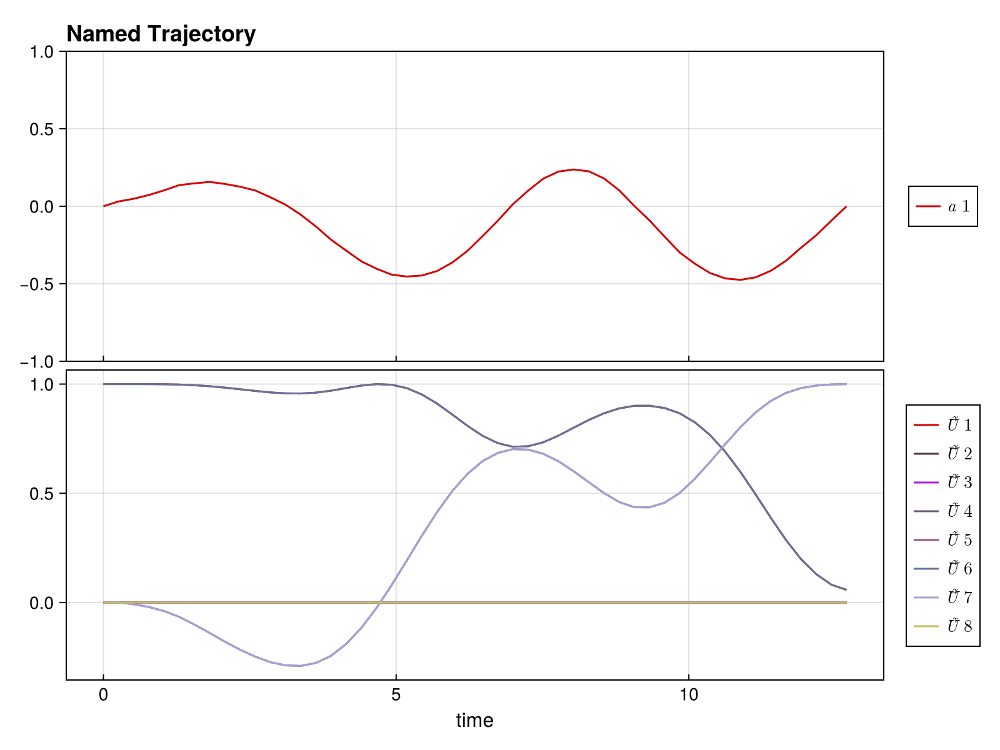

In [29]:
# default = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; init_trajectory=traj, Q_t=1.0)
a_guess = [0.1*randn(1, T) for _ in 1:5]

default2 = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; a_guess=deepcopy(a_guess[1]))
solve!(default2; max_iter=250, print_level=5)

p1 = CairoMakie.plot(default2.trajectory, [:a, :Ũ⃗])

display(p1)

Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(default2.trajectory, varsys_add);
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println

#### Run Solvers

#### For adjoint w/o toggling frame

In [30]:
n_guesses = 5
a_guess = [0.1*randn(1, T) for _ in 1:n_guesses]
a_bounds = fill(a_bound, 1)
da_bounds = fill(da_bound, 1)
dda_bounds = fill(dda_bound, 1)
control_bounds = (a_bounds, da_bounds, dda_bounds)
varsys_add_seeds = []
varsys_mult_seeds = []
varsys_both_seeds = []

n_drives = varsys_add.n_drives

for i in 1:n_guesses
    add_traj = initialize_trajectory(
                    U_goal,
                    T,
                    Δt,
                    n_drives,
                    control_bounds;
                    a_guess=deepcopy(a_guess[i]),
                    system=varsys_add
                )
    push!(varsys_add_seeds, add_traj)

    mult_traj = initialize_trajectory(
                U_goal,
                T,
                Δt,
                n_drives,
                control_bounds;
                a_guess=deepcopy(a_guess[i]),
                system=varsys_mult
            )
    push!(varsys_mult_seeds, mult_traj)

    both_traj = initialize_trajectory(
                U_goal,
                T,
                Δt,
                n_drives,
                control_bounds;
                a_guess=deepcopy(a_guess[i]),
                system=varsys_both
            )
    push!(varsys_both_seeds, both_traj)
end

In [31]:
sweep_rob_loss_λ = [i for i in 2:6]
n_lambdas = length(sweep_rob_loss_λ)
n_seeds = length(a_guess)

5

In [38]:
add_adj_probs_test = []

for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        
    # Add problem
    add_prob = UnitaryVariationalProblem(
        varsys_add, U_goal, T, Δt;
        init_trajectory=deepcopy(varsys_add_seeds[1]),
        # variational_scales=[rob_scale],
        sensitive_times=[[T]],
        piccolo_options=piccolo_opts,
        Q_s=10.0^(-λ)
    )
    solve!(add_prob; max_iter=200, print_level=5)
    push!(add_adj_probs_test, add_prob)
end

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:    15112
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1733

Total number of variables............................:      982
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      148
                     variables with only upper bounds:        0
Total number of equality co

Question: Why do certain values of lambda fail to converge (seemingly) randomly even when solver finds an optimal solution ??

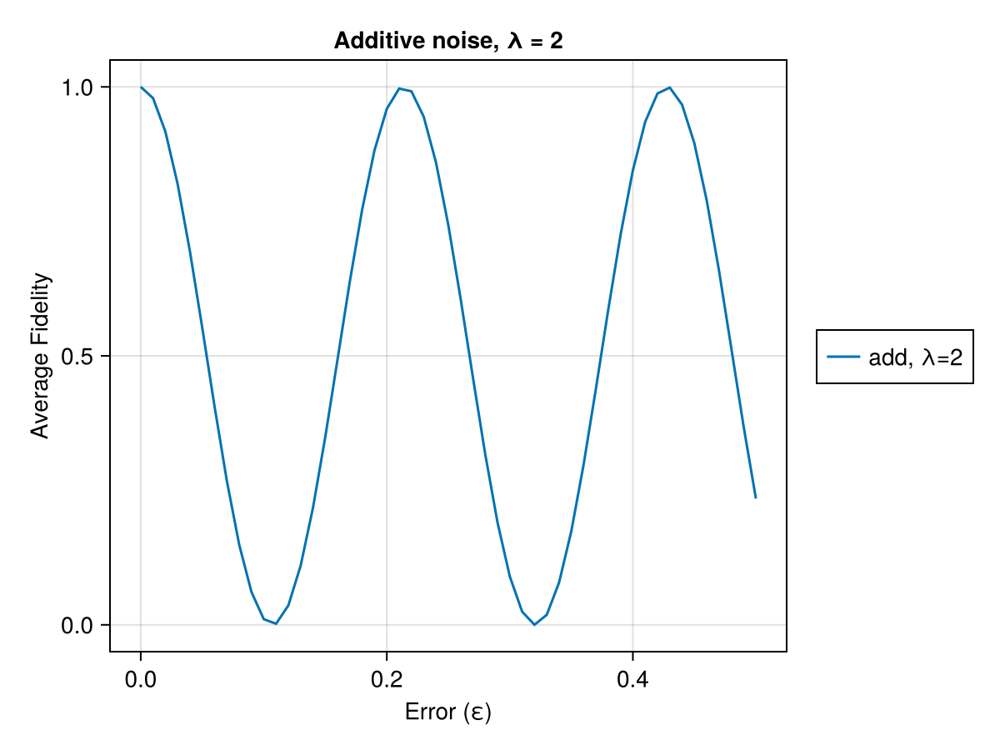

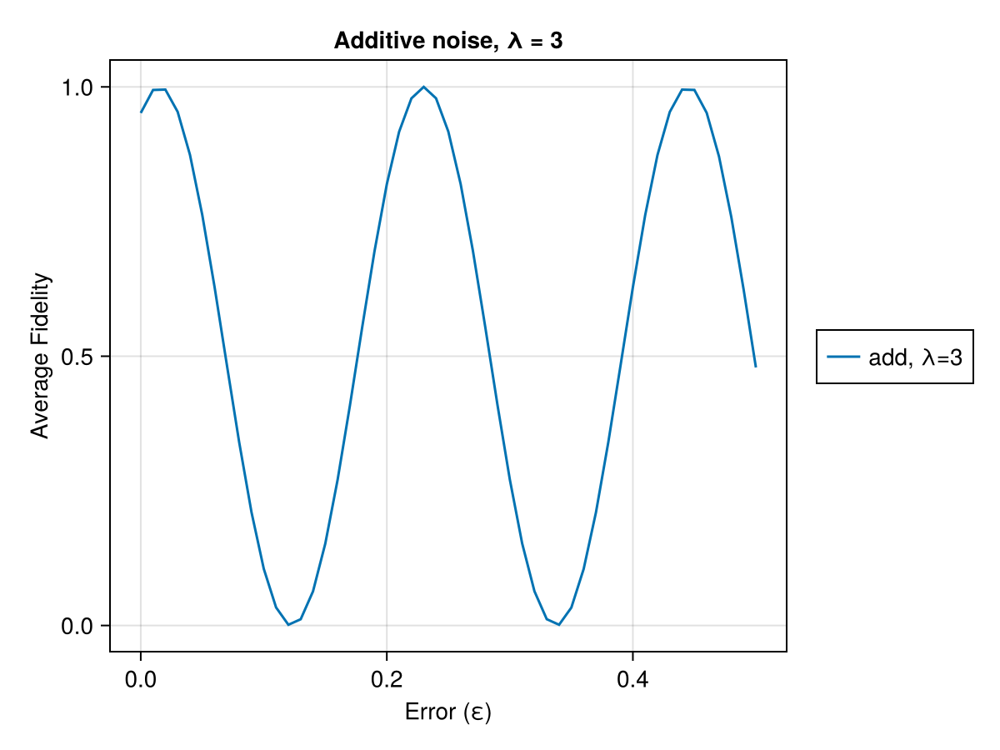


Processing λ = 2

Processing λ = 3

Processing λ = 4

Processing λ = 5

Processing λ = 6


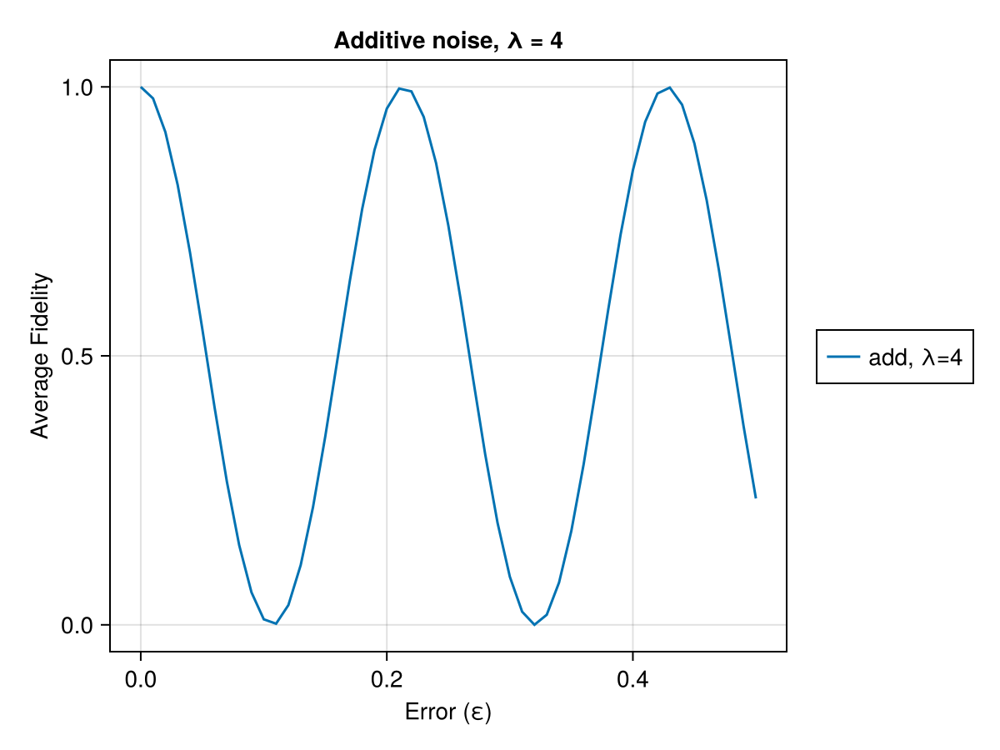

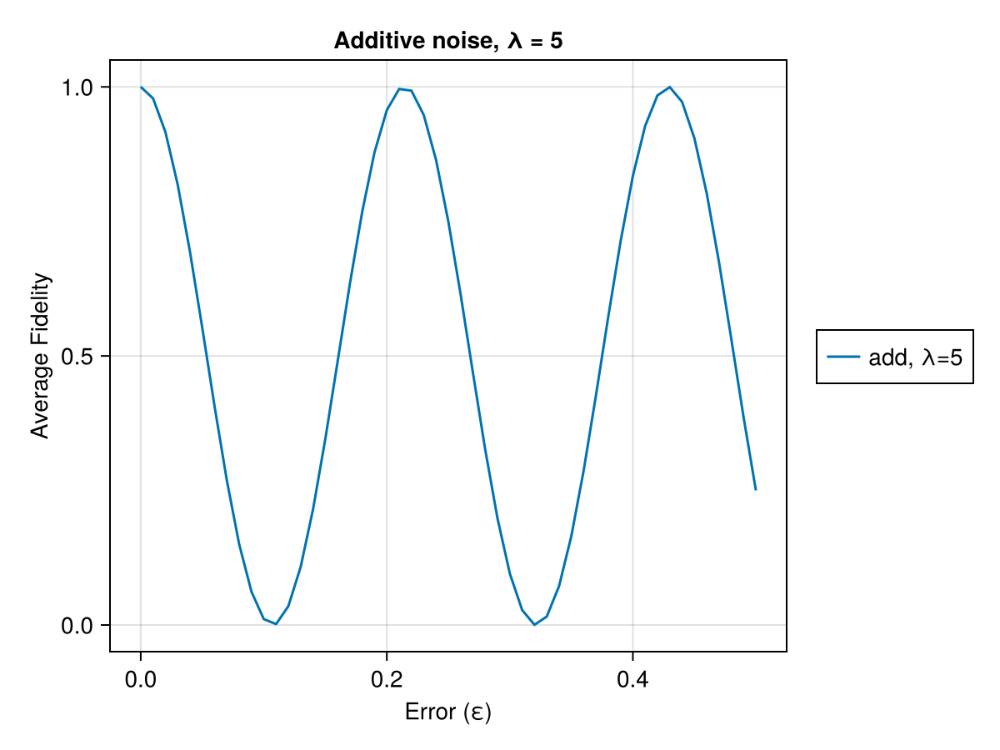

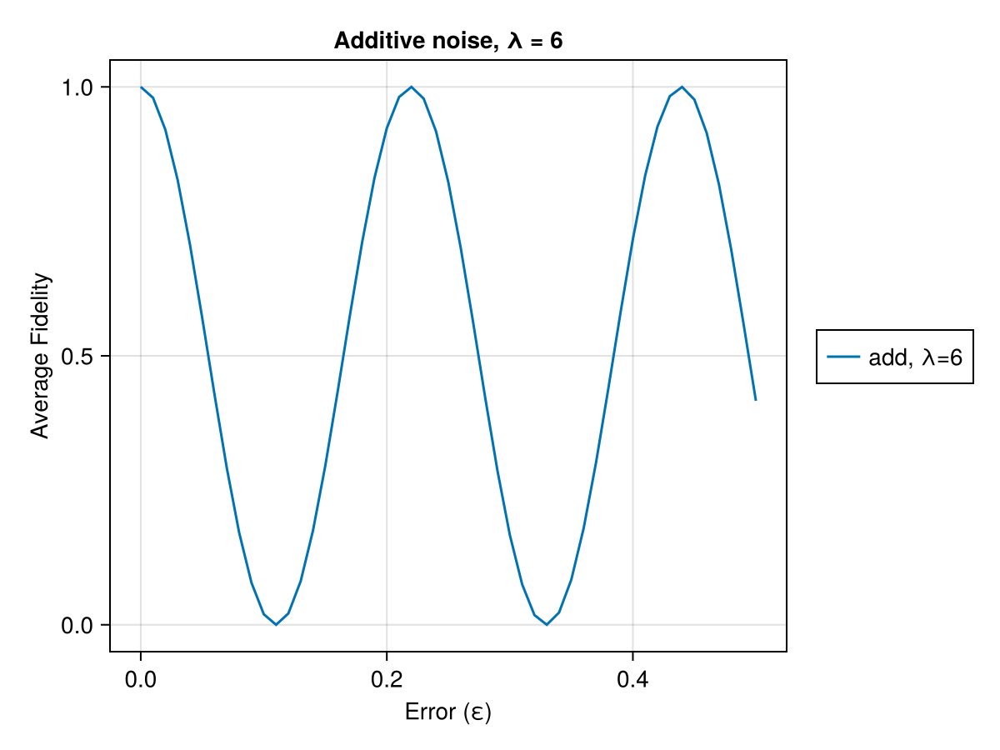

In [39]:
for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
    println("\nProcessing λ = $λ")
    f = Figure()
    ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
    # ax2 = Axis(f[2, 1], title="Multiplicative noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

    # Define system functions for additive and multiplicative noise
    additive_system = ε -> QuantumSystem(ε * PAULIS.X, [H_drive_add])
    multiplicative_system = ε -> QuantumSystem([(1 + ε) * H_drive])

    # Plot for both noise types
    # Additive noise
    ys_add = [unitary_rollout_fidelity(add_adj_probs_test[λ_idx].trajectory, additive_system(ε)) for ε in εs]
    lines!(ax1, εs, ys_add, label="add, λ=$λ", color=colors[1], linestyle=:solid)
    
    # Multiplicative noise
    # ys_mult = [unitary_rollout_fidelity(add_adj_probs[λ_idx].trajectory, multiplicative_system(ε)) for ε in εs]
    # lines!(ax2, εs, ys_mult, label="mult, λ=$λ, seed_idx=$seed_idx", color=colors[1], linestyle=:solid)


    # Add legends
    Legend(f[1, 2], ax1, position=:lb)
    # Legend(f[2, 2], ax2, position=:lb)
    
    display(f)
end

In [40]:
for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
    Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(add_adj_probs_test[λ_idx].trajectory, varsys_add);
    QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println
    QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[1][:, end ÷ 2]) |> println
    # QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[2][:, end ÷ 2]) |> println
    QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[1][:, end]) |> println
    # QuantumObjectives.unitary_fidelity_loss(Ũ⃗_vars[2][:, end]) |> println
end

0.9999971207825279
2687.342676580146
46694.1422806108
0.9515874724683085
2631.2557468646783
45719.59925003992
0.9999999992976023
2684.5093383720605
46644.91138104199
0.9999999996306395
2658.698114037574
46196.426343382176
0.9999999967833186
2410.2449769064724
41879.408556120456


Run 5 seeds for various weights (lambdas) using the adjoint objective on only the additive error problem

In [ ]:
add_adj_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        
        # Add problem
        add_prob = UnitaryVariationalProblem(
            varsys_add, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_add_seeds[i]),
            variational_scales=[rob_scale],
            sensitive_times=[[T]],
            piccolo_options=piccolo_opts,
            Q_s=λ
        )
        solve!(add_prob; max_iter=200, print_level=5)
        add_adj_probs[i, λ_idx] = add_prob
    end
end

Plot the corresponding fidelity as a function of epsilon (error magnitude)

In [ ]:
H_drive_add = H_drive
εs = 0:0.01:0.5
colors = Makie.wong_colors()

for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("\nProcessing λ = $λ")
        f = Figure()
        ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        ax2 = Axis(f[2, 1], title="Multiplicative noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

        # Define system functions for additive and multiplicative noise
        additive_system = ε -> QuantumSystem(ε * PAULIS.X, [H_drive_add])
        multiplicative_system = ε -> QuantumSystem([(1 + ε) * H_drive])

        # Plot for both noise types
        # Additive noise
        ys_add = [unitary_rollout_fidelity(add_adj_probs[seed_idx, λ_idx].trajectory, additive_system(ε)) for ε in εs]
        lines!(ax1, εs, ys_add, label="add, λ=$λ, seed_idx=$seed_idx", color=colors[1], linestyle=:solid)
        
        # Multiplicative noise
        ys_mult = [unitary_rollout_fidelity(add_adj_probs[seed_idx, λ_idx].trajectory, multiplicative_system(ε)) for ε in εs]
        lines!(ax2, εs, ys_mult, label="mult, λ=$λ, seed_idx=$seed_idx", color=colors[1], linestyle=:solid)


        # Add legends
        Legend(f[1, 2], ax1, position=:lb)
        Legend(f[2, 2], ax2, position=:lb)
        
        display(f)
    end
end


setup the same problems for the default, multiplcative, both error cases

In [ ]:
default_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        defaults = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; a_guess=deepcopy(a_guess[i]))
        solve!(default; max_iter=250, print_level=5)
        default_probs[i,λ_idx] = defaults
    end
end

In [ ]:
mult_adj_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        # Mult problem
        mult_prob = UnitaryVariationalProblem(
            varsys_mult, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_mult_seeds[i]),
            variational_scales=[rob_scale],
            sensitive_times=[[T]], 
            piccolo_options=piccolo_opts,
            Q_s=λ
        )
        solve!(mult_prob; max_iter=200, print_level=5)
        mult_adj_probs[i, λ_idx] = mult_prob
    end
end

In [ ]:
both_adj_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

# Optimization loop with index counter
for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        
        # Both problem
        both_prob = UnitaryVariationalProblem(
            varsys_both, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_both_seeds[i]),
            variational_scales=[rob_scale,rob_scale],
            sensitive_times=[[T]],
            piccolo_options=piccolo_opts,
            Q_s=λ
        )
        solve!(both_prob; max_iter=200, print_level=5)
        both_adj_probs[i, λ_idx] = both_prob
    end
end

plot everything above

In [ ]:
H_drive_add = H_drive
εs = 0:0.01:0.5
colors = Makie.wong_colors()

# Function to compute average fidelity across seeds
function compute_avg_fidelity(probs_matrix, λ_idx, system_func, ε)
    fidelities = Float64[]
    for seed_idx in 1:n_seeds
        prob = probs_matrix[seed_idx, λ_idx]
        fid = unitary_rollout_fidelity(prob.trajectory, system_func(ε))
        push!(fidelities, fid)
    end
    return mean(fidelities)
end

# Plot for each λ
for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("\nProcessing λ = $λ")
        f = Figure()
        ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        ax2 = Axis(f[2, 1], title="Multiplicative noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

        # Define system functions for additive and multiplicative noise
        additive_system = ε -> QuantumSystem(ε * PAULIS.X, [H_drive_add])
        multiplicative_system = ε -> QuantumSystem([(1 + ε) * H_drive])

        # Plot data structure: (matrix, label, color)
        plot_configs = [
            (default_probs, "default", colors[1]),
            (mult_adj_probs, "mult adjoint", colors[2]),
            (add_adj_probs, "add adjoint", colors[3]),
            (both_adj_probs, "both adjoint", colors[4])
        ]

        # Plot for both noise types
        for (probs_matrix, label, color) in plot_configs
            # Additive noise
            prob = [probs_matrix[seed_idx, λ_idx]) for ε in εs]
            ys_add = [unitary_rollout_fidelity(prob.trajectory, additive_system) for ε in εs]
            lines!(ax1, εs, ys_add, label=label, color=color, linestyle=:solid)
            
            # Multiplicative noise
            prob = [probs_matrix[seed_idx, λ_idx]) for ε in εs]
            ys_mult = [unitary_rollout_fidelity(prob.trajectory, multiplicative_system) for ε in εs]
            lines!(ax2, εs, ys_mult, label=label, color=color, linestyle=:solid)
        end

        # Add legends
        Legend(f[1, 2], ax1, position=:lb)
        Legend(f[2, 2], ax2, position=:lb)
        
        display(f)
    end
end


#### Toggling frame w/o adjoint robustness

example problem (sanity check)

In [45]:
ex_tog_default = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; activate_rob_loss=true, H_err=H_drive, Q_t=1.0, a_guess=deepcopy(a_guess[1]))
solve!(ex_tog_default, max_iter=150, print_level=5)

ex_add_prob = UnitaryVariationalProblem(
            varsys_add, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_add_seeds[1]),
            variational_scales=[rob_scale],
            sensitive_times=[[T]],
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0,
            Q_r=0.0,
            Q_t=1.0
        )
solve!(ex_add_prob; max_iter=150, print_level=5)

    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	control derivative names: [:da, :dda]
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:     4728
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:   155333

Total number of variables............................:      590
                     variables with only lower bounds:        0
                variables with 

In [53]:
ex_mult_prob = UnitaryVariationalProblem(
    varsys_mult, U_goal, T, Δt;
    init_trajectory=deepcopy(varsys_mult_seeds[1]),
    variational_scales=[rob_scale],
    sensitive_times=[[T]], 
    piccolo_options=piccolo_opts,
    activate_rob_loss=true,
    H_err=H_drive,
    Q_s=0.0,
    Q_r=0.0,
    Q_t=1.0
)
solve!(ex_mult_prob; max_iter=250, print_level=5)

ex_both_prob = UnitaryVariationalProblem(
            varsys_both, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_both_seeds[1]),
            variational_scales=[rob_scale,rob_scale],
            sensitive_times=[[T]],
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0,
            Q_r=0.0,
            Q_t=1.0
        )
solve!(ex_both_prob; max_iter=250, print_level=5)

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:    15112
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:   155397

Total number of variables............................:      982
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      148
                     variables with only upper bounds:        0
Total number of equality co

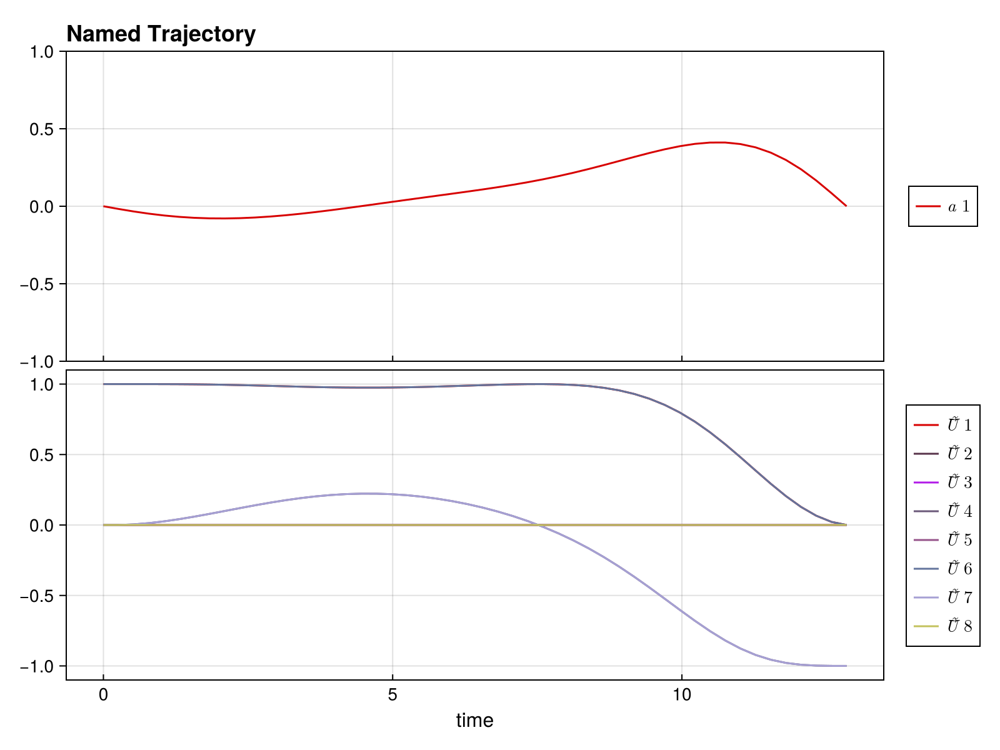

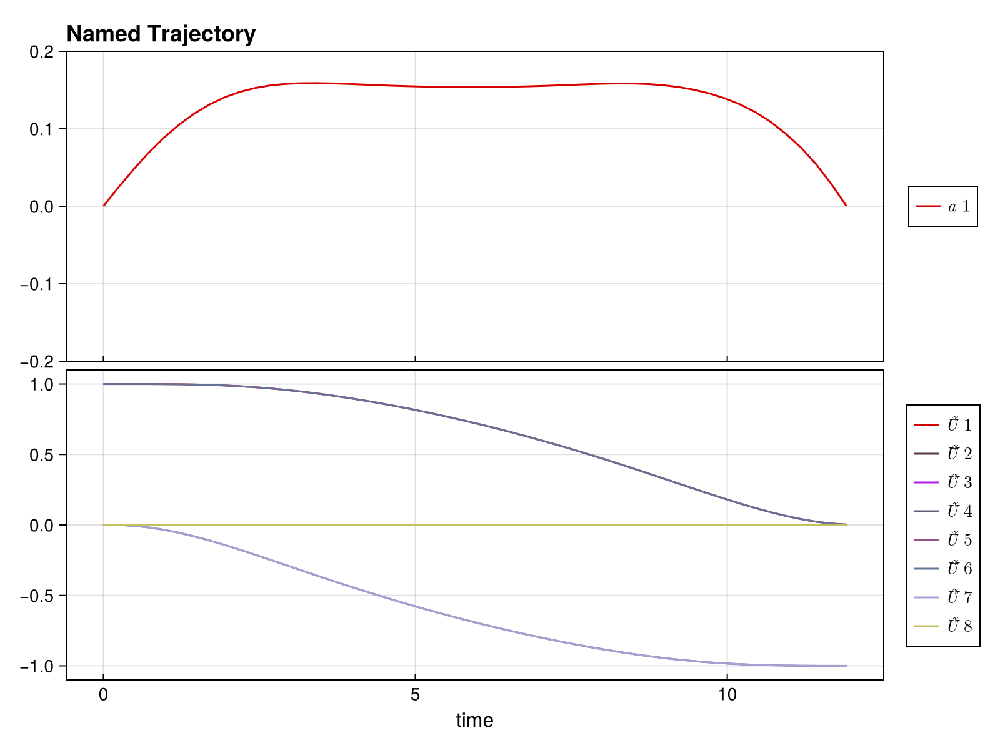

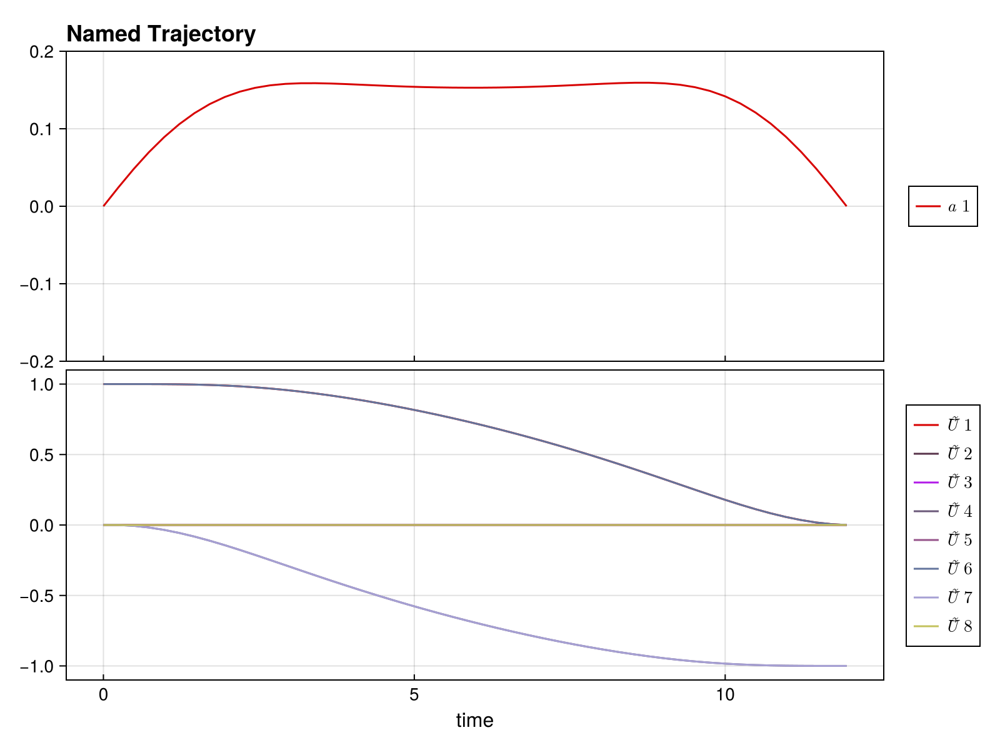

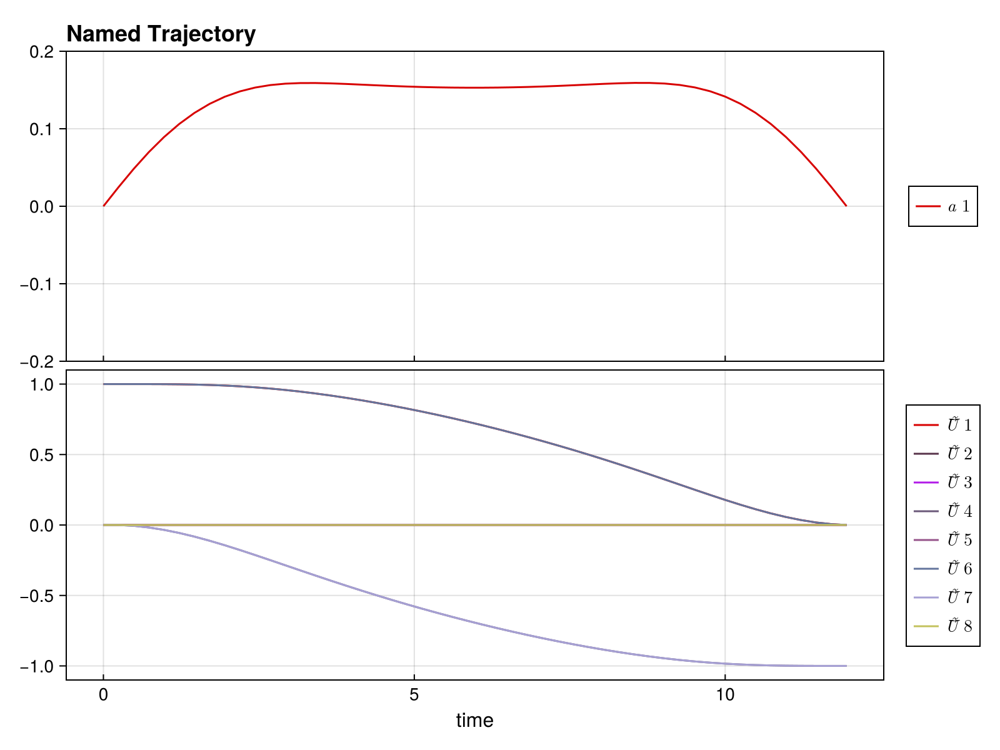

CairoMakie.Screen{IMAGE}


In [54]:
p1 = CairoMakie.plot(ex_tog_default.trajectory, [:a, :Ũ⃗])
p2 = CairoMakie.plot(ex_add_prob.trajectory, [:a, :Ũ⃗])
p3 = CairoMakie.plot(ex_mult_prob.trajectory, [:a, :Ũ⃗])
p4 = CairoMakie.plot(ex_both_prob.trajectory, [:a, :Ũ⃗])

display(p1)
display(p2)
display(p3)
display(p4)

In [47]:
Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(ex_tog_default.trajectory, varsys_add)
println(QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X))


0.9999999996480735


In [48]:
Ũ⃗_t, Ũ⃗_vars = variational_unitary_rollout(ex_add_prob.trajectory, varsys_add)
QuantumObjectives.unitary_fidelity_loss(Ũ⃗_t[:, end], GATES.X) |> println


0.9999921531879424


In [55]:
# default case

# additive

# mult
Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(ex_mult_prob.trajectory, varsys_mult)
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println


# both problem
Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(ex_both_prob.trajectory, varsys_add)
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println

Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(ex_both_prob.trajectory, varsys_mult);
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println

Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(ex_both_prob.trajectory, varsys_both);
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println

0.9999999984018164
0.9999999984253014
0.9999999984253014
0.9999999984253014


In [58]:
using Base.Threads
# (Optional, if your solves use BLAS and you want to avoid oversubscription)
# using LinearAlgebra; BLAS.set_num_threads(1)

# define parameters
sweep_rob_loss_λ = [i for i in 0.0:5.0]
n_lambdas = length(sweep_rob_loss_λ)
n_seeds   = 2

# Initialize storage for results
tog_defaults   = Matrix{Any}(undef, n_seeds, n_lambdas)
add_tog_probs  = Matrix{Any}(undef, n_seeds, n_lambdas)
mult_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
both_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

@threads for i in 1:n_seeds
    # Accessing arrays from multiple threads is fine as long as indices are unique.
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)

        # Build problems (pure construction, no shared mutation)
        tog_default = UnitarySmoothPulseProblem(
            sys, U_goal, T, Δt; activate_rob_loss=true, H_err=H_drive, Q_t=λ
        )

        add_prob = UnitaryVariationalProblem(
            varsys_add, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_add_seeds[i].trajectory),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0, Q_r=0.0, Q_t=λ
        )

        mult_prob = UnitaryVariationalProblem(
            varsys_mult, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_mult_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0, Q_r=0.0, Q_t=λ
        )

        both_prob = UnitaryVariationalProblem(
            varsys_both, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_both_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0, Q_r=0.0, Q_t=λ
        )

        # Run the four solves concurrently and store results
        @sync begin
            @spawn begin
                solve!(tog_default, max_iter=100, print_level=5)
                tog_defaults[i, λ_idx] = tog_default
            end
            @spawn begin
                solve!(add_prob; max_iter=100, print_level=5)
                add_tog_probs[i, λ_idx] = add_prob
            end
            @spawn begin
                solve!(mult_prob; max_iter=100, print_level=5)
                mult_tog_probs[i, λ_idx] = mult_prob
            end
            @spawn begin
                solve!(both_prob; max_iter=100, print_level=5)
                both_tog_probs[i, λ_idx] = both_prob
            end
        end
    end
end


    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	control derivative names: [:da, :dda]
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: initial value of Ũ⃗ᵥ1
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applyi

Excessive output truncated after 524308 bytes.

In [ ]:
using Base.Threads

sweep_rob_loss_λ = [i for i in 0.0:5.0]
n_lambdas = length(sweep_rob_loss_λ)
n_seeds   = length(a_guess)

tog_defaults   = Matrix{Any}(undef, n_seeds, n_lambdas)
add_tog_probs  = Matrix{Any}(undef, n_seeds, n_lambdas)
mult_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
both_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

# Optional but recommended: if your linear algebra libs use threads too,
# disable their internal threading to avoid contention:
using LinearAlgebra; BLAS.set_num_threads(1)

# --- parallel sweep over all (seed, λ) pairs ---
@threads for idx in 1:(n_seeds * n_lambdas)
    # map linear idx -> (i, λ_idx)
    i      = fld(idx - 1, n_lambdas) + 1
    λ_idx  = mod(idx - 1, n_lambdas) + 1
    λ      = sweep_rob_loss_λ[λ_idx]

    # 1) toggle default
    tog_default = UnitarySmoothPulseProblem(
        sys, U_goal, T, Δt;
        activate_rob_loss = true,
        H_err = H_drive,
        Q_t = λ,
    )
    solve!(tog_default, max_iter = 150, print_level = 5)
    tog_defaults[i, λ_idx] = tog_default

    # 2) additive error case
    add_prob = UnitaryVariationalProblem(
        varsys_add, U_goal, T, Δt;
        init_trajectory = deepcopy(varsys_add_seeds[i].trajectory),
        piccolo_options = piccolo_opts,
        activate_rob_loss = true,
        H_err = H_drive,
        Q_s = 0.0,
        Q_r = 0.0,
        Q_t = λ,
    )
    solve!(add_prob; max_iter = 150, print_level = 5)
    add_tog_probs[i, λ_idx] = add_prob

    # 3) multiplicative error case
    mult_prob = UnitaryVariationalProblem(
        varsys_mult, U_goal, T, Δt;
        init_trajectory = deepcopy(varsys_mult_seeds[i]),
        piccolo_options = piccolo_opts,
        activate_rob_loss = true,
        H_err = H_drive,
        Q_s = 0.0,
        Q_r = 0.0,
        Q_t = λ,
    )
    solve!(mult_prob; max_iter = 150, print_level = 5)
    mult_tog_probs[i, λ_idx] = mult_prob

    # 4) both error case
    both_prob = UnitaryVariationalProblem(
        varsys_both, U_goal, T, Δt;
        init_trajectory = deepcopy(varsys_both_seeds[i]),
        piccolo_options = piccolo_opts,
        activate_rob_loss = true,
        H_err = H_drive,
        Q_s = 0.0,
        Q_r = 0.0,
        Q_t = λ,
    )
    solve!(both_prob; max_iter = 150, print_level = 5)
    both_tog_probs[i, λ_idx] = both_prob
end


In [10]:
# define parameters
sweep_rob_loss_λ = [i for i in 0.0:5.0]
n_lambdas = length(sweep_rob_loss_λ)
n_seeds = length(a_guess)

# Initialize storage for results
tog_defaults = Matrix{Any}(undef, n_seeds, n_lambdas)
add_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
mult_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
both_tog_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

# loop through solve!
for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)

        tog_default = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; activate_rob_loss=true, H_err=H_drive, Q_t=λ)
        solve!(tog_default, max_iter=150, print_level=5)
        tog_defaults[i, λ_idx] = tog_default
            
        # Additive error case
        add_prob = UnitaryVariationalProblem(
            varsys_add, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_add_seeds[i].trajectory),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0,
            Q_r=0.0,
            Q_t=λ
        )
        solve!(add_prob; max_iter=150, print_level=5)
        add_tog_probs[i, λ_idx] = add_prob

        # Mult error case
        mult_prob = UnitaryVariationalProblem(
            varsys_mult, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_mult_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0,
            Q_r=0.0,
            Q_t=λ
        )
        solve!(mult_prob; max_iter=150, print_level=5)
        mult_tog_probs[i, λ_idx] = mult_prob

        # Both error case
        both_prob = UnitaryVariationalProblem(
            varsys_both, U_goal, T, Δt;
            init_trajectory=deepcopy(varsys_both_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=H_drive,
            Q_s=0.0,
            Q_r=0.0,
            Q_t=λ
        )
        solve!(both_prob; max_iter=150, print_level=5)
        both_tog_probs[i, λ_idx] = both_prob
    end
end

    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	control derivative names: [:da, :dda]
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.17, runnin

Excessive output truncated after 524349 bytes.

## Plot Fidelity vs. Errors

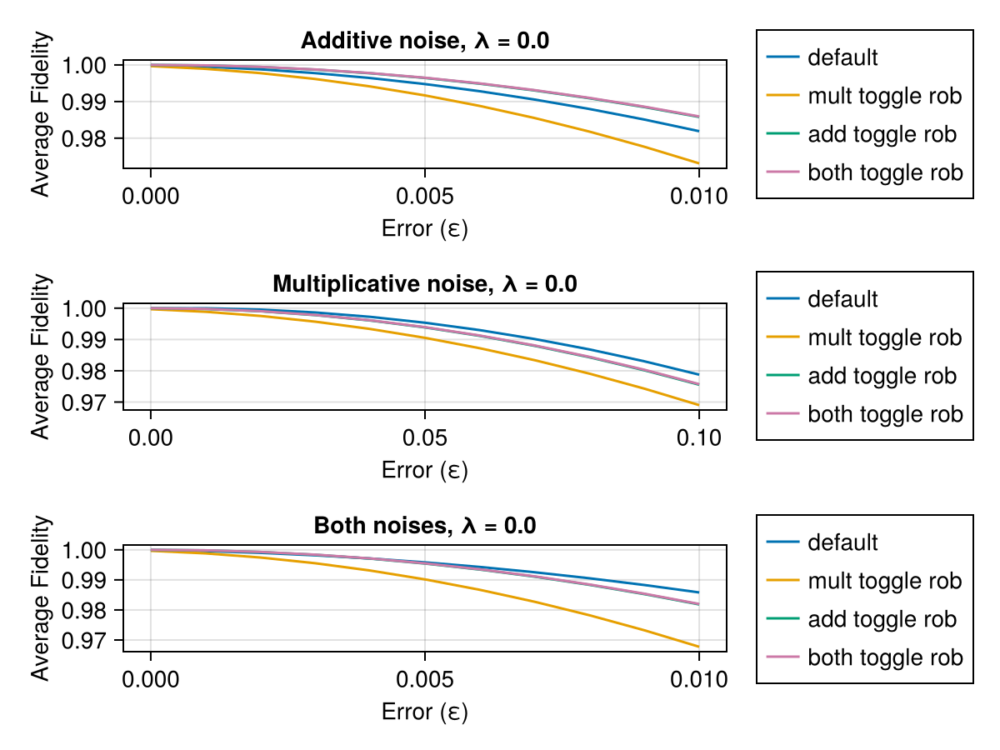

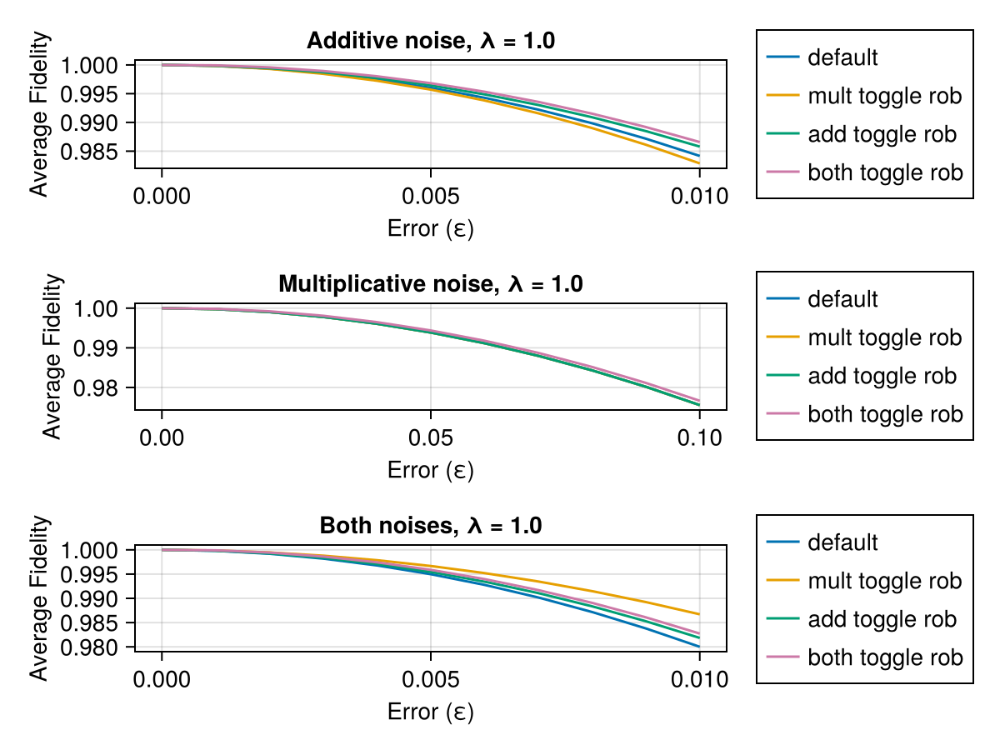

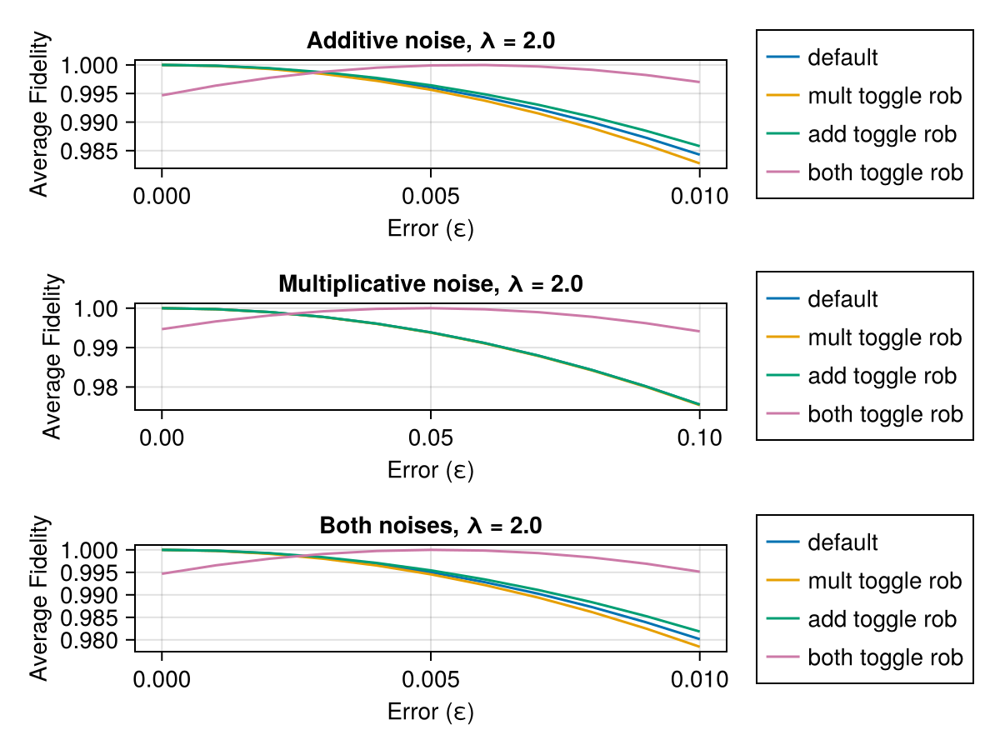

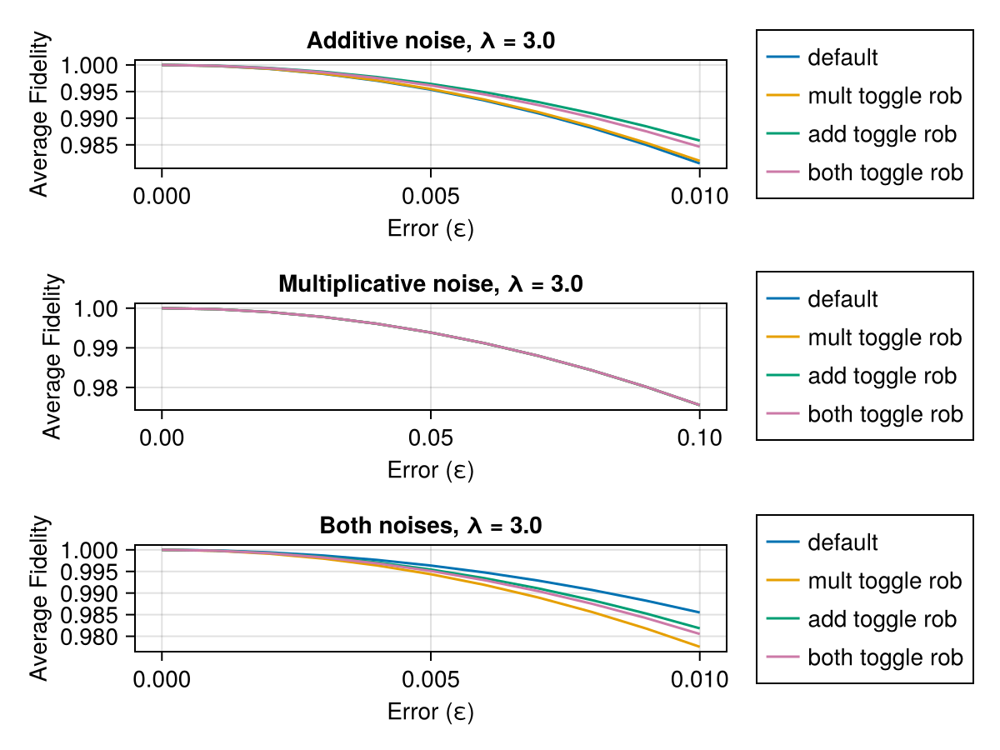

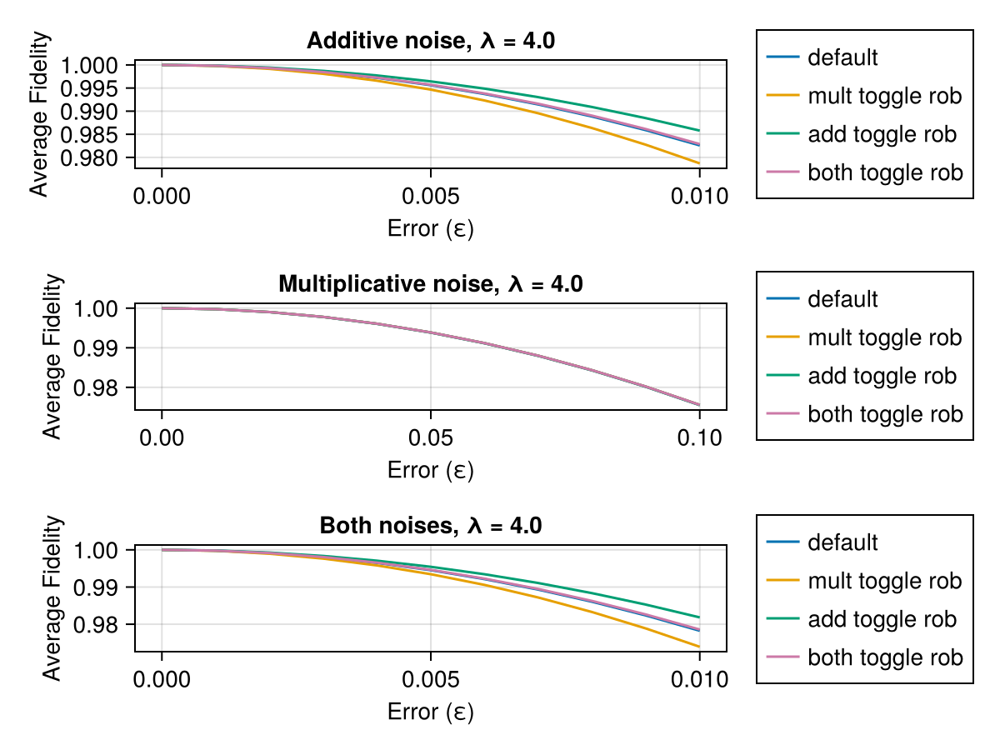

...

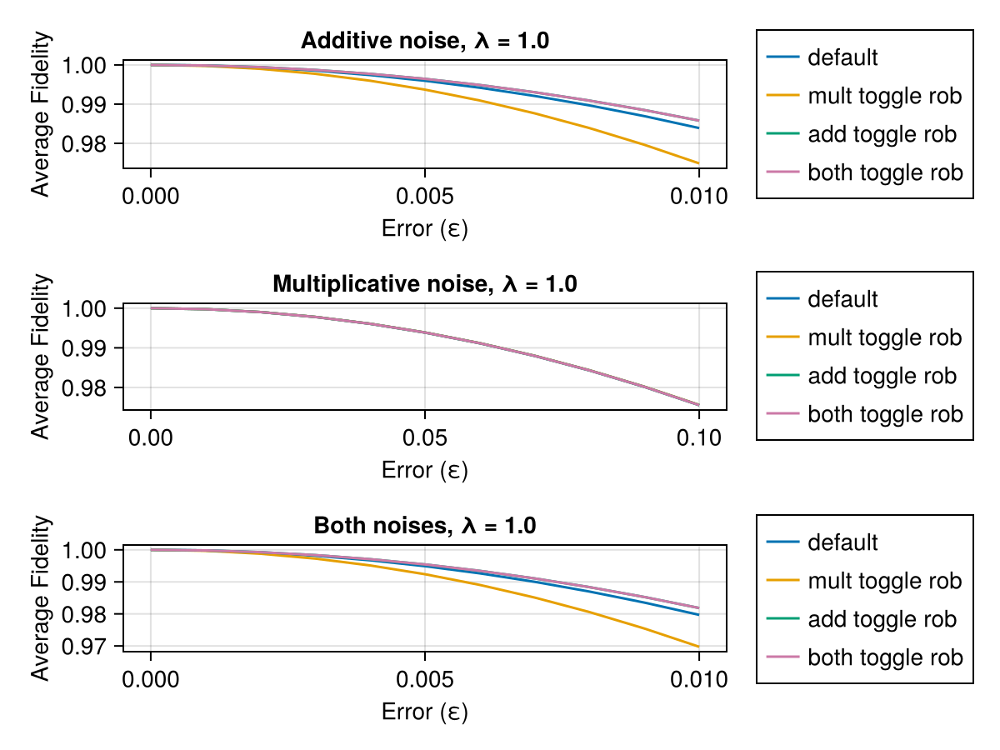

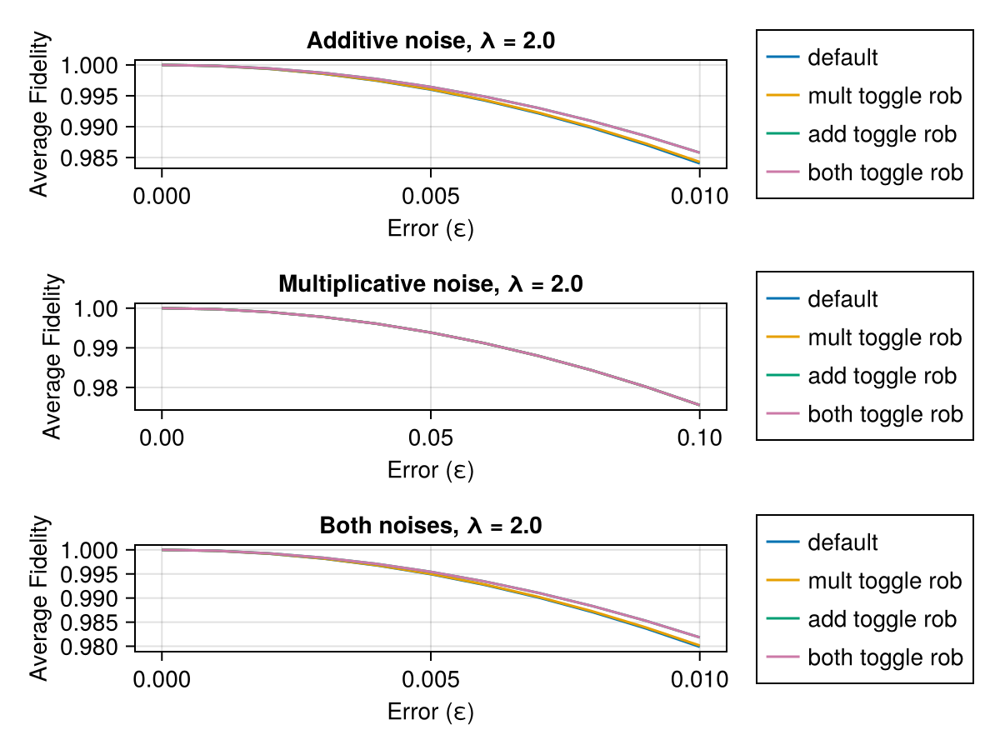

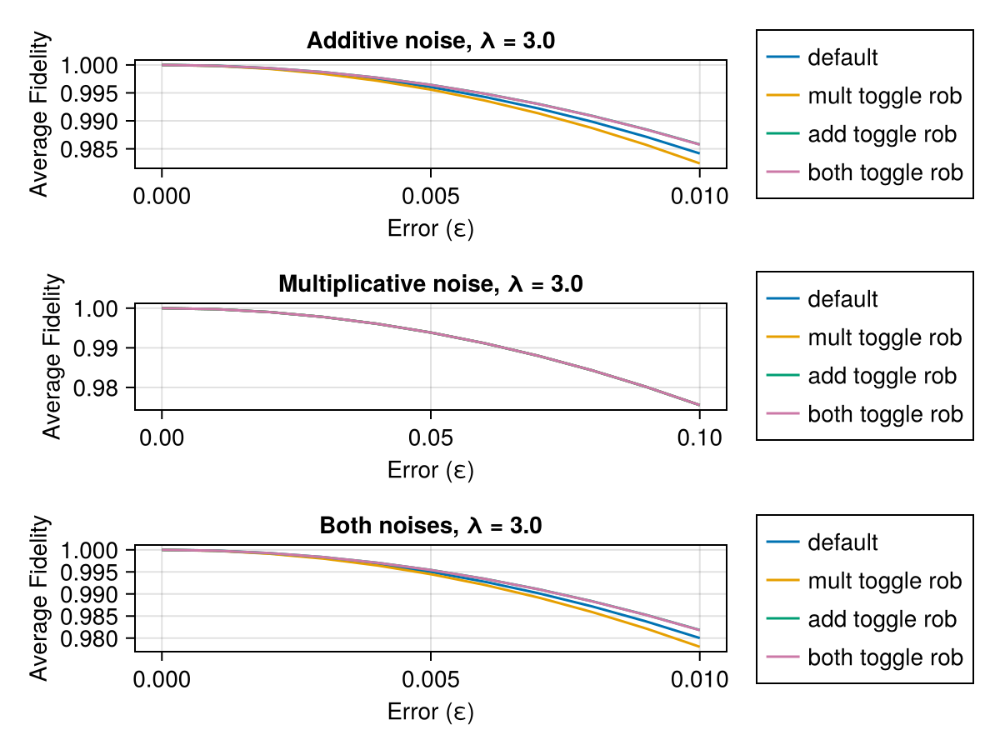

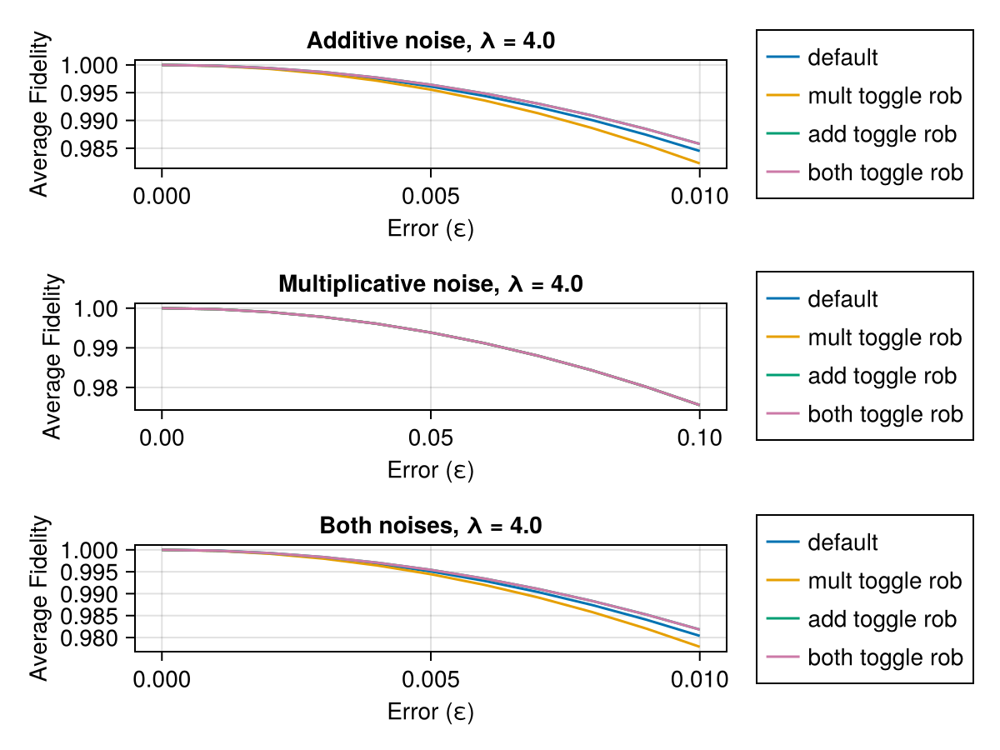

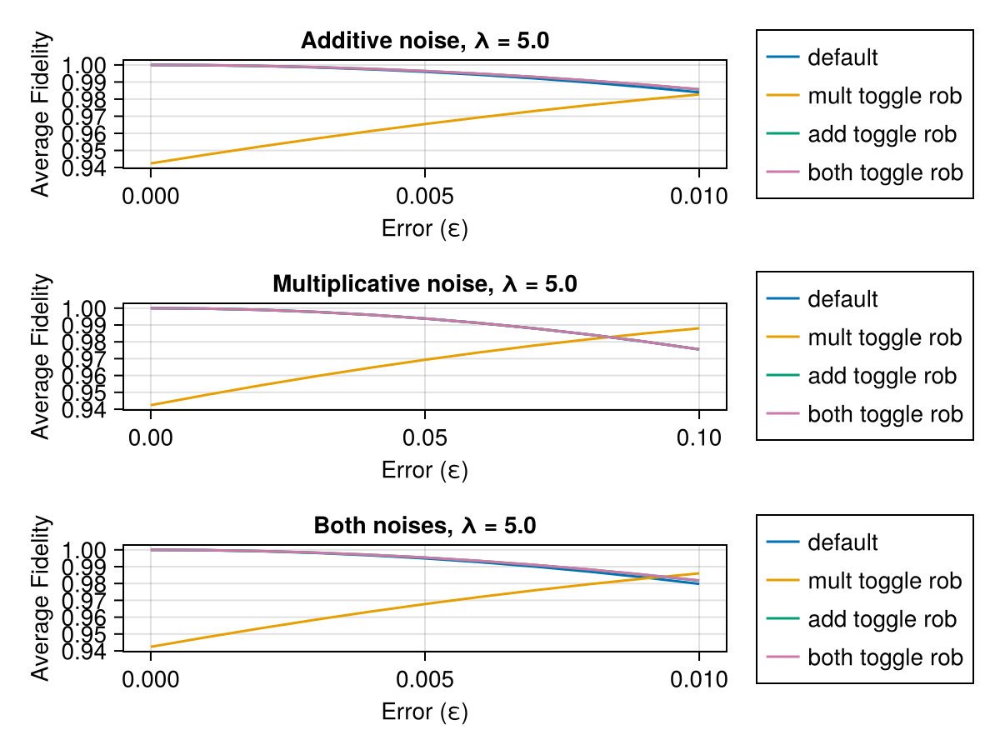

In [59]:
H_drive_add = H_drive
εs = 0:0.01:0.1
colors = Makie.wong_colors()

# Plot for each λ
for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("\nProcessing λ = $λ")
        f = Figure()
        ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        ax2 = Axis(f[2, 1], title="Multiplicative noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        ax3 = Axis(f[3, 1], title="Both noises, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

        # Define system functions for additive and multiplicative noise
        additive_system = ε -> QuantumSystem(ε * PAULIS.X, [H_drive_add])
        multiplicative_system = ε -> QuantumSystem([(1 + ε) * H_drive])
        both_system = ε -> QuantumSystem(ε * PAULIS.X, [(1 + ε) * H_drive])
        # Plot data structure: (matrix, label, color)
        plot_configs = [
            (tog_defaults, "default", colors[1]),
            (add_tog_probs, "mult toggle rob", colors[2]),
            (mult_tog_probs, "add toggle rob", colors[3]),
            (both_tog_probs, "both toggle rob", colors[4])
        ]

        # Plot for both noise types
        for (probs_matrix, label, color) in plot_configs
            # Additive noise
            prob = probs_matrix[seed_idx, λ_idx]
            ys_add = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * PAULIS.X, [H_drive_add])) for ε in 0:0.001:0.01]
            lines!(ax1, 0.1*εs, ys_add, label=label, color=color, linestyle=:solid)
            
            # Multiplicative noise
            ys_mult = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem([(1 + ε) * H_drive])) for ε in εs]
            lines!(ax2, εs, ys_mult, label=label, color=color, linestyle=:solid)
            
            # Both noises
            ys_both = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * PAULIS.X, [(1 + ε) * H_drive])) for ε in 0:0.001:0.01]
            lines!(ax3, 0.1*εs, ys_both, label=label, color=color, linestyle=:solid)
        end

        Legend(f[1, 2], ax1, position=:lb)
        Legend(f[2, 2], ax2, position=:lb)
        Legend(f[3, 2], ax3, position=:lb)

        display(f)
    end
end


#TODO: add plots of trajectories

## Pareto Frontier Plots

### Robust (w/o adjoint)

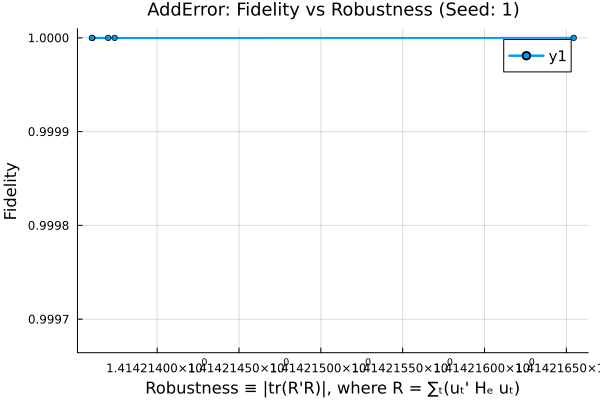

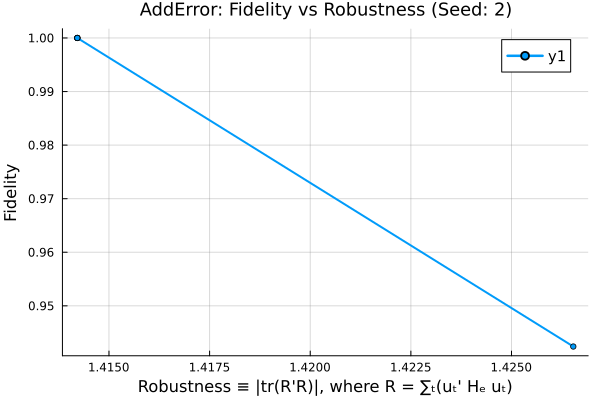

BoundsError: BoundsError: attempt to access 2×6 Matrix{Any} at index [3, 1]

In [63]:
# using Plots
# Initialize storage for fidelities for each lambda
n_lambdas = length(sweep_rob_loss_λ)
n_seeds = length(a_guess)
templates = [add_tog_probs, mult_tog_probs, both_tog_probs]
# Store fidelities for each lambda and error combination


base_fidelities = zeros(n_seeds, n_lambdas)
additive_fidelities = zeros(n_seeds, n_lambdas)
multiplicative_fidelities = zeros(n_seeds, n_lambdas)
both_fidelities = zeros(n_seeds, n_lambdas)
obj_vals = zeros(n_seeds, n_lambdas)


configs = [
            (add_tog_probs, additive_fidelities, varsys_add),
            (mult_tog_probs, multiplicative_fidelities, varsys_mult),
            (both_tog_probs, both_fidelities, varsys_both)
        ]
title_idx = 1
titles = ["Add", "mult", "Both"]

for (probs, fidelities, system) in configs
    println("----------------!New noise model!----------------")
    # Calculate fidelities for each seed
    for seed_idx in 1:n_seeds
        # Calculate fidelities for each lambda
        for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
            
            prob = probs[seed_idx, λ_idx]
            println("\nProcessing λ = $λ")
            obj = QuantumObjectives.FirstOrderObjective(Hₑ, prob.trajectory, [T]; Q_t=λ)#prob.trajectory.Ũ⃗ᵥ1[:, end]
            Z_vec = vec(prob.trajectory)
            obj_val = obj.L(Z_vec)/λ
            obj_vals[seed_idx, λ_idx] = obj_val
            
            rob_fid = unitary_rollout_fidelity(prob.trajectory, system)
            fidelities[seed_idx, λ_idx] = rob_fid
        end
        title_name = titles[title_idx]
        p1 = Plots.plot(xlabel="Robustness ≡ |tr(R'R)|, where R = ∑ₜ(uₜ' Hₑ uₜ)", 
                ylabel="Fidelity",
                title=title_name*"Error: Fidelity vs Robustness (Seed: $seed_idx)",
                legendfontsize=10, titlefontsize=12,
                grid=true, gridwidth=1, gridcolor=:gray, gridalpha=0.3,
                legend=:topright)

            
        Plots.plot!(p1, obj_vals[seed_idx, :], fidelities[seed_idx, :],
            marker=:circle, markersize=3, linewidth=2)


        # Display all plots
        display(p1)
    end
    title_idx += 1
end

# # Detailed results table
# println("\n=== Detailed Results Table ===")
# for seed_idx in 1:n_seeds
#     println("\nseed idx = $seed_idx:")
#     println("Weight λ | Base Fidelity | Add Fidelity | Mult Fidelity | Both")
#     println("-" ^ 40)
#     for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
#         println("$(lpad(round(λ, digits=4), 7)) | $(lpad(round(base_fidelities[seed_idx, λ_idx], digits=6), 12)) | $(lpad(round(additive_fidelities[seed_idx, λ_idx], digits=6), 12)) | $(lpad(round(multiplicative_fidelities[seed_idx, λ_idx], digits=6), 13)) | $(lpad(round(both_fidelities[seed_idx, λ_idx], digits=6), 12)) |")
#     end
# end


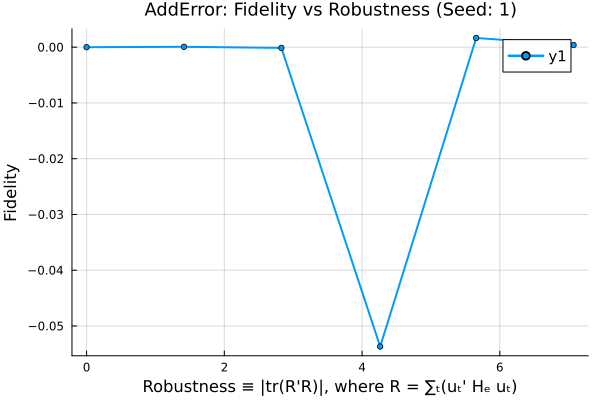

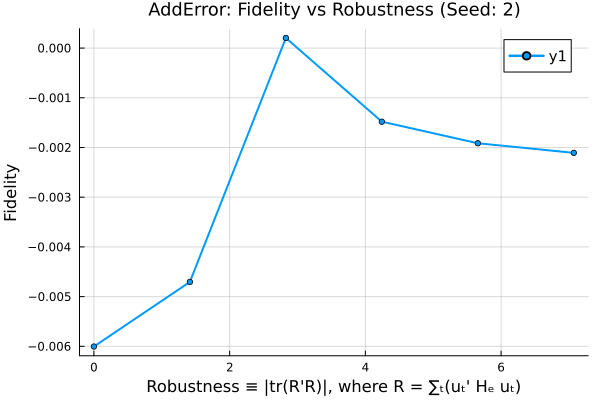

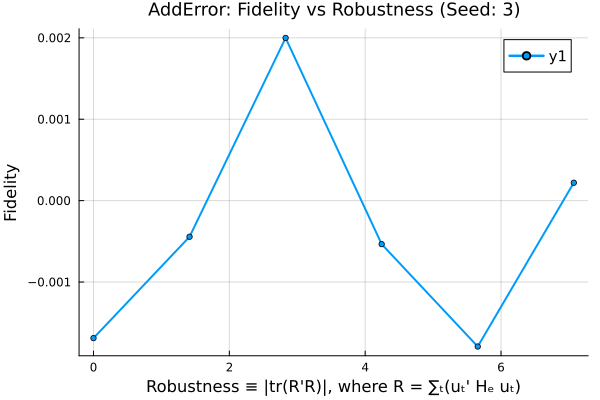

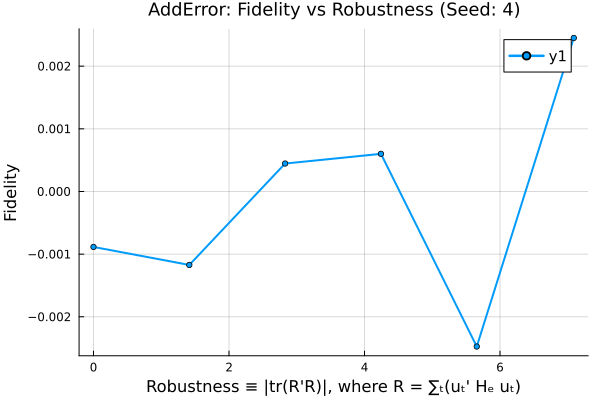

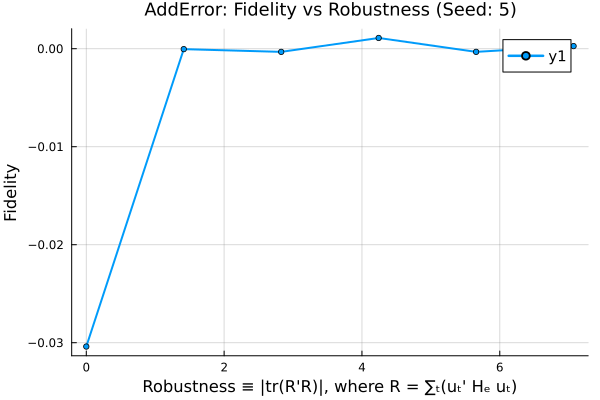

...

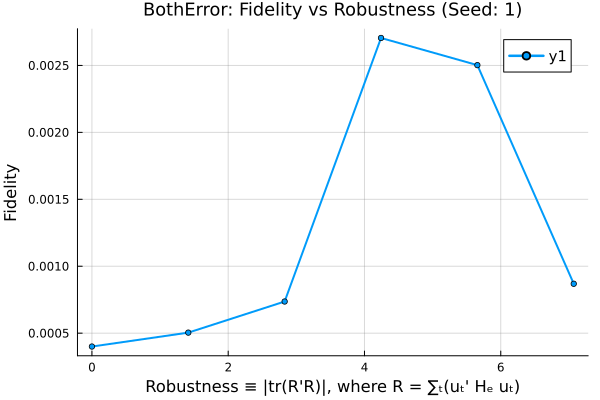

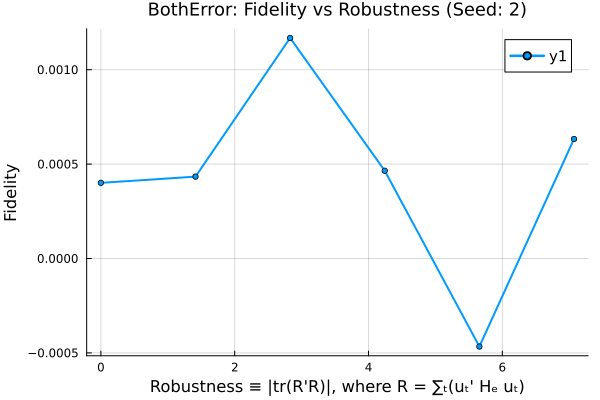

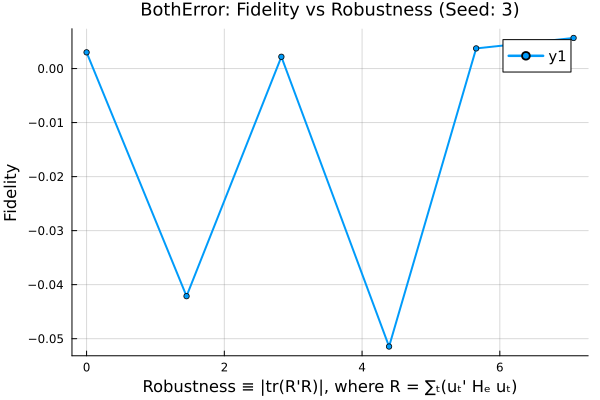

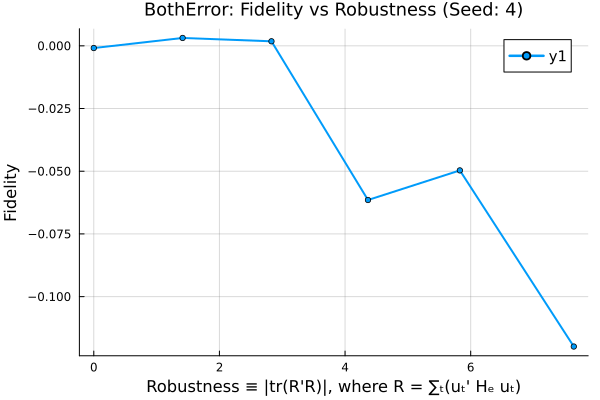

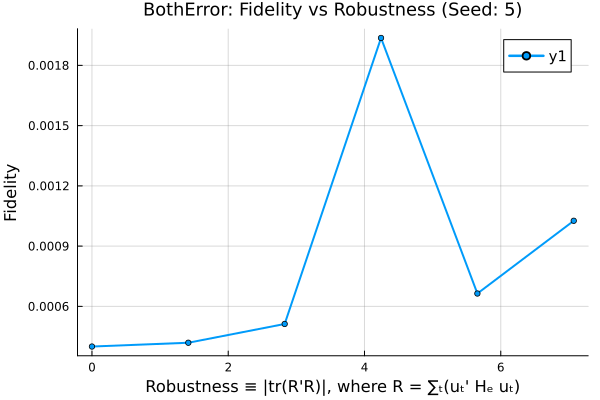

In [80]:
using Plots
# Initialize storage for fidelities for each lambda
εs = 0:0.01:.1
n_lambdas = length(sweep_rob_loss_λ)
n_errors = length(error_magnitudes)
n_seeds = length(a_guess)
templates = [add_tog_probs, mult_tog_probs, both_tog_probs]
# Store fidelities for each lambda and error combination


base_fidelities = zeros(n_seeds, n_lambdas)
additive_fidelities = zeros(n_seeds, n_lambdas)
multiplicative_fidelities = zeros(n_seeds, n_lambdas)
both_fidelities = zeros(n_seeds, n_lambdas)
obj_vals = zeros(n_seeds, n_lambdas)

# Function to compute average fidelity across seeds
# function compute_avg_fidelity(prob, λ_idx, system_func, error_magnitudes)
#     fidelities = Float64[]
#     for ε in 1:error_magnitudes
#         fid = unitary_rollout_fidelity(prob.trajectory, system_func(ε))
#         push!(fidelities, fid)
#     end
#     return mean(fidelities)
err_sys = QuantumSystem([H_drive_add])
additive_system = ε -> QuantumSystem(ε * PAULIS.X, [H_drive_add])
multiplicative_system = ε -> QuantumSystem([(1 + ε) * H_drive])
both_system = ε -> QuantumSystem(ε * PAULIS.X, [(1 + ε) * H_drive])

configs = [
            (add_tog_probs, additive_fidelities, additive_system, 0:0.001:.01),
            (mult_tog_probs, multiplicative_fidelities, multiplicative_system, 0:0.01:.1),
            (both_tog_probs, both_fidelities, both_system, 0:0.001:.01)
        ]
title_idx = 1
titles = ["Add", "mult", "Both"]
for (probs, fidelities, system, εs) in configs
    println("----------------!New noise model!----------------")
    # Calculate fidelities for each seed
    for seed_idx in 1:n_seeds
        # Calculate fidelities for each lambda
        for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
            
            prob = probs[seed_idx, λ_idx]
            println("\nProcessing λ = $λ")
            obj = QuantumObjectives.FirstOrderObjective(Hₑ, prob.trajectory, [T]; Q_t=λ)#prob.trajectory.Ũ⃗ᵥ1[:, end]
            Z_vec = vec(prob.trajectory)
            obj_val = obj.L(Z_vec)
            obj_vals[seed_idx, λ_idx] = obj_val
            
            base = tog_defaults[seed_idx, λ_idx]
            base_fid = mean([unitary_rollout_fidelity(base.trajectory, system(ε)) for ε in εs])
            rob_fid = mean([unitary_rollout_fidelity(prob.trajectory, system(ε)) for ε in εs])
            rel_fidelity = (rob_fid - base_fid)
            fidelities[seed_idx, λ_idx] = rel_fidelity
        end
        title_name = titles[title_idx]
        p1 = Plots.plot(xlabel="Robustness ≡ |tr(R'R)|, where R = ∑ₜ(uₜ' Hₑ uₜ)", 
                ylabel="Fidelity",
                title=title_name*"Error: Fidelity vs Robustness (Seed: $seed_idx)",
                legendfontsize=10, titlefontsize=12,
                grid=true, gridwidth=1, gridcolor=:gray, gridalpha=0.3,
                legend=:topright)

            
        Plots.plot!(p1, obj_vals[seed_idx, :], fidelities[seed_idx, :],
            marker=:circle, markersize=3, linewidth=2)


        # Display all plots
        display(p1)
    end
    title_idx += 1
end

# Detailed results table
println("\n=== Detailed Results Table ===")
for seed_idx in 1:n_seeds
    println("\nseed idx = $seed_idx:")
    println("Weight λ | Base Fidelity | Add Fidelity | Mult Fidelity | Both")
    println("-" ^ 40)
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("$(lpad(round(λ, digits=4), 7)) | $(lpad(round(base_fidelities[seed_idx, λ_idx], digits=6), 12)) | $(lpad(round(additive_fidelities[seed_idx, λ_idx], digits=6), 12)) | $(lpad(round(multiplicative_fidelities[seed_idx, λ_idx], digits=6), 13)) | $(lpad(round(both_fidelities[seed_idx, λ_idx], digits=6), 12)) |")
    end
end


### additive robust prob